In [172]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

In [76]:
df = pd.read_csv("heart_attack_prediction_dataset_copy.csv")

## Heart Attack Risk Analysis
> **By- Prasis Gautam**

- The main objective of this data analysis is to interpret the relation between the different factors that affect the risk of Heart attack

### What is heart attack??

A heart attack, also called a myocardial infarction, happens when a part of the heart muscle doesn’t get enough blood.

The more time that passes without treatment to restore blood flow, the greater the damage to the heart muscle.

Coronary artery disease (CAD) is the main cause of heart attack. A less common cause is a severe spasm, or sudden contraction, of a coronary artery that can stop blood flow to the heart muscle.

<img src="https://www.csl.com/-/media/shared/vita-2022/heart-attack-illustration.jpg?h=900&iar=0&w=1600&cropregion=0,0,1600,900&hash=D6E2E7392B3CA169AF4F2B5E5DC23F2D" style="height:300px" />

### What are the risk factors for heart attack?

Several health conditions, your lifestyle, and your age and family history can increase your risk for heart disease and heart attack. These are called risk factors. About half of all Americans have at least one of the three key risk factors for heart disease: high blood pressure, high blood cholesterol, and smoking.

### What can I do to recover after a heart attack?
If you’ve had a heart attack, your heart may be damaged. This could affect your heart’s rhythm and its ability to pump blood to the rest of the body. You may also be at risk for another heart attack or conditions such as stroke, kidney disorders, and peripheral arterial disease (PAD).

You can lower your chances of having future health problems following a heart attack with these steps:

- **Physical activity—** Talk with your health care team about the things you do each day in your life and work. Your doctor may want you to limit work, travel, or sexual activity for some time after a heart attack.
- **Lifestyle changes—** Eating a healthier diet, increasing physical activity, quitting smoking, and managing stress in addition to taking prescribed medicines can help improve your heart health and quality of life. Ask your health care team about attending a program called cardiac rehabilitation to help you make these lifestyle changes.
- **Cardiac rehabilitation—** Cardiac rehabilitation is an important program for anyone recovering from a heart attack, heart failure, or other heart problem that required surgery or medical care.


In [61]:
df.head(10)

,Patient ID,Age,Sex,Cholesterol,Blood Pressure,Heart Rate,Diabetes,Family History,Smoking,Obesity,...,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,BMW7812,67,1,208,158/88,72,0,0,1,0,...,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0
1,CZE1114,21,1,389,165/93,98,1,1,1,1,...,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0
2,BNI9906,21,2,324,174/99,72,1,0,0,0,...,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,0
3,JLN3497,84,1,383,163/100,73,1,1,1,0,...,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0
4,GFO8847,66,1,318,91/88,93,1,1,1,1,...,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0
5,ZOO7941,54,2,297,172/86,48,1,1,1,0,...,7.798752,241339,20.146839,795,5,10,Germany,Europe,Northern Hemisphere,1
6,WYV0966,90,1,358,102/73,84,0,0,1,0,...,0.627356,190450,28.885811,284,4,10,Canada,North America,Northern Hemisphere,1
7,XXM0972,84,1,220,131/68,107,0,0,1,1,...,10.543780,122093,22.221862,370,6,7,Japan,Asia,Northern Hemisphere,1
8,XCQ5937,20,1,145,144/105,68,1,0,1,1,...,11.348787,25086,35.809901,790,7,4,Brazil,South America,Southern Hemisphere,0
9,FTJ5456,43,2,248,160/70,55,0,1,1,1,...,4.055115,209703,22.558917,232,7,7,Japan,Asia,Northern Hemisphere,0


In [128]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 26 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Patient ID                       8763 non-null   object 
 1   Age                              8763 non-null   int64  
 2   Sex                              8763 non-null   int64  
 3   Cholesterol                      8763 non-null   int64  
 4   Blood Pressure                   8763 non-null   object 
 5   Heart Rate                       8763 non-null   int64  
 6   Diabetes                         8763 non-null   int64  
 7   Family History                   8763 non-null   int64  
 8   Smoking                          8763 non-null   int64  
 9   Obesity                          8763 non-null   int64  
 10  Alcohol Consumption              8763 non-null   int64  
 11  Exercise Hours Per Week          8763 non-null   float64
 12  Diet                

In [129]:
#Inspect missing values in the dataset
print(df.isnull().values.sum())
df = df.replace(" ", np.NaN)
df = df.fillna(df.mean())
print(df.isnull().values.sum())

0
0


C:\Users\dell\AppData\Local\Temp\ipykernel_9620\242200491.py:4: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df = df.fillna(df.mean())


> Here i have replaced Male with integer value 1 and Female with the integer value 2


In [127]:
df.describe()

,Age,Sex,Cholesterol,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Heart Attack Risk
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,53.707977,1.302636,259.877211,75.021682,0.652288,0.492982,0.896839,0.501426,0.598083,10.014284,0.495835,0.498345,5.469702,5.993690,158263.181901,28.891446,417.677051,3.489672,7.023508,0.358211
std,21.249509,0.459425,80.863276,20.550948,0.476271,0.499979,0.304186,0.500026,0.490313,5.783745,0.500011,0.500026,2.859622,3.466359,80575.190806,6.319181,223.748137,2.282687,1.988473,0.479502
min,18.000000,1.000000,120.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002442,0.000000,0.000000,1.000000,0.001263,20062.000000,18.002337,30.000000,0.000000,4.000000,0.000000
25%,35.000000,1.000000,192.000000,57.000000,0.000000,0.000000,1.000000,0.000000,0.000000,4.981579,0.000000,0.000000,3.000000,2.998794,88310.000000,23.422985,225.500000,2.000000,5.000000,0.000000
50%,54.000000,1.000000,259.000000,75.000000,1.000000,0.000000,1.000000,1.000000,1.000000,10.069559,0.000000,0.000000,5.000000,5.933622,157866.000000,28.768999,417.000000,3.000000,7.000000,0.000000
75%,72.000000,2.000000,330.000000,93.000000,1.000000,1.000000,1.000000,1.000000,1.000000,15.050018,1.000000,1.000000,8.000000,9.019124,227749.000000,34.324594,612.000000,5.000000,9.000000,1.000000
max,90.000000,2.000000,400.000000,110.000000,1.000000,1.000000,1.000000,1.000000,1.000000,19.998709,1.000000,1.000000,10.000000,11.999313,299954.000000,39.997211,800.000000,7.000000,10.000000,1.000000


> Here the analyzed things are:
- The count of surveys is 8763 people.
- The maximum age of surveyed people is 90 while the minimum being 18.
- The mean age of surveyed people is 54.
- The mean going towards <1.5 denotes that the number of surveyed people were majorly male.
- The maximum Exercise hours per week is 20 while the minimum is 0 and the mean exercise hours per week is 10 hours.
- The maximum Triglycerides in the survey was 800 while the minimum was 30. The mean count was 417.
- The mean value of Heart risk is <0.5 thus indicating that the people with no Heart attack risk were more in the survey.

# Correlation between Variables using HeatMap¶

C:\Users\dell\AppData\Local\Temp\ipykernel_9620\4218888453.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),


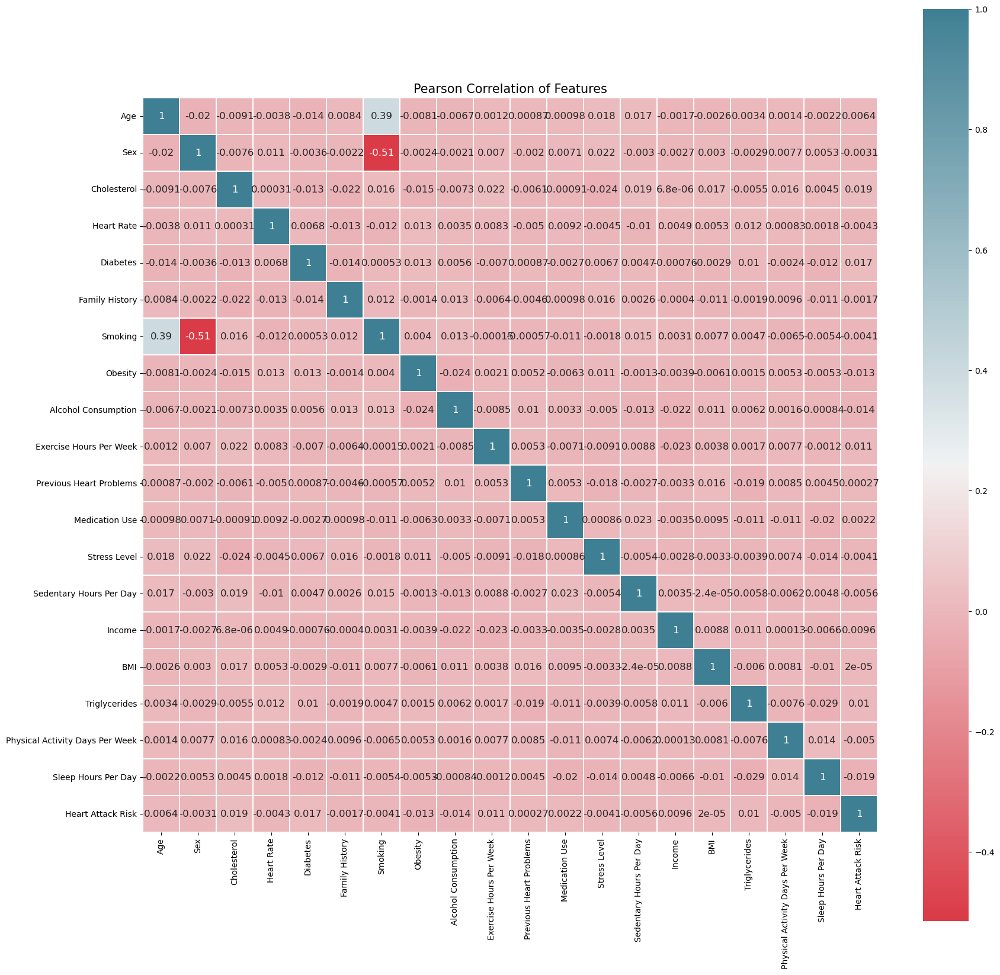

In [64]:
plt.figure(figsize=(20,20))
plt.title('Pearson Correlation of Features', size = 15)
colormap = sns.diverging_palette(10, 220, as_cmap = True)
sns.heatmap(df.corr(),
            cmap = colormap,
            square = True,
            annot = True,
            linewidths=0.1,vmax=1.0, linecolor='white',
            annot_kws={'fontsize':12 })
plt.show()

### From the above heat map we can see the following results:

- We can see that there is high corelation between heart attack rate and cholestrol, Diabetes, exercise hours per week.
- We can observe that there is less dependent on obesity, alcohol consumption, previous heart problems and income.
- Smoking and age are not the major causes of Heart attack Risk

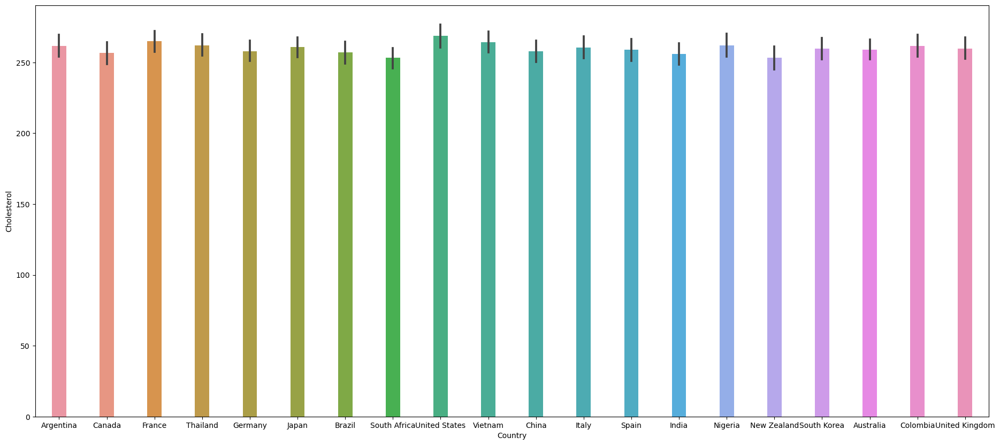

In [135]:
plt.figure(figsize=(23, 10))
sns.barplot(df, x='Country',y='Cholesterol',width=0.3)
plt.show()

> From the above bar graph plotted against country (x-axis) and cholesterol(y-axis), we get the see the following results:
- Most country had the colesterol level above 250.
- South africa had the least cholesterol level of below 250.
- United states had the highest cholesterol level among the nations.

<AxesSubplot: xlabel='Exercise Hours Per Week', ylabel='Cholesterol'>

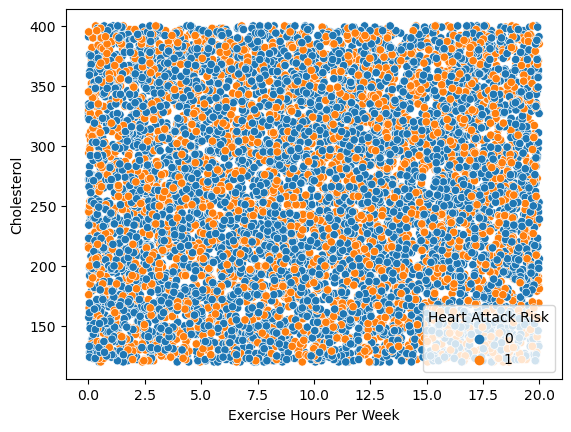

In [160]:
sns.scatterplot(data= df, x='Exercise Hours Per Week', y='Cholesterol',hue='Heart Attack Risk')

> The above scaterplot shows the following:
- Exercise Hours per week is plotted along the X-axis.
- Cholesterol is plotted along the Y-axis.
- Hue is plotted against the Heart Attack Risk. (1= Risk, 0= No risk)

<AxesSubplot: xlabel='Sleep Hours Per Day', ylabel='Exercise Hours Per Week'>

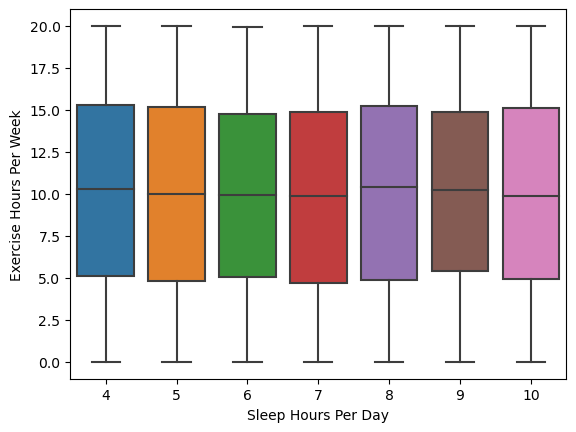

In [176]:
sns.boxplot(data=df, x='Sleep Hours Per Day',y='Exercise Hours Per Week')

> The above box plot shows the following data:
- Sleep Hours per day along the x-axis.
- Exercise hours per week along the y-axis.

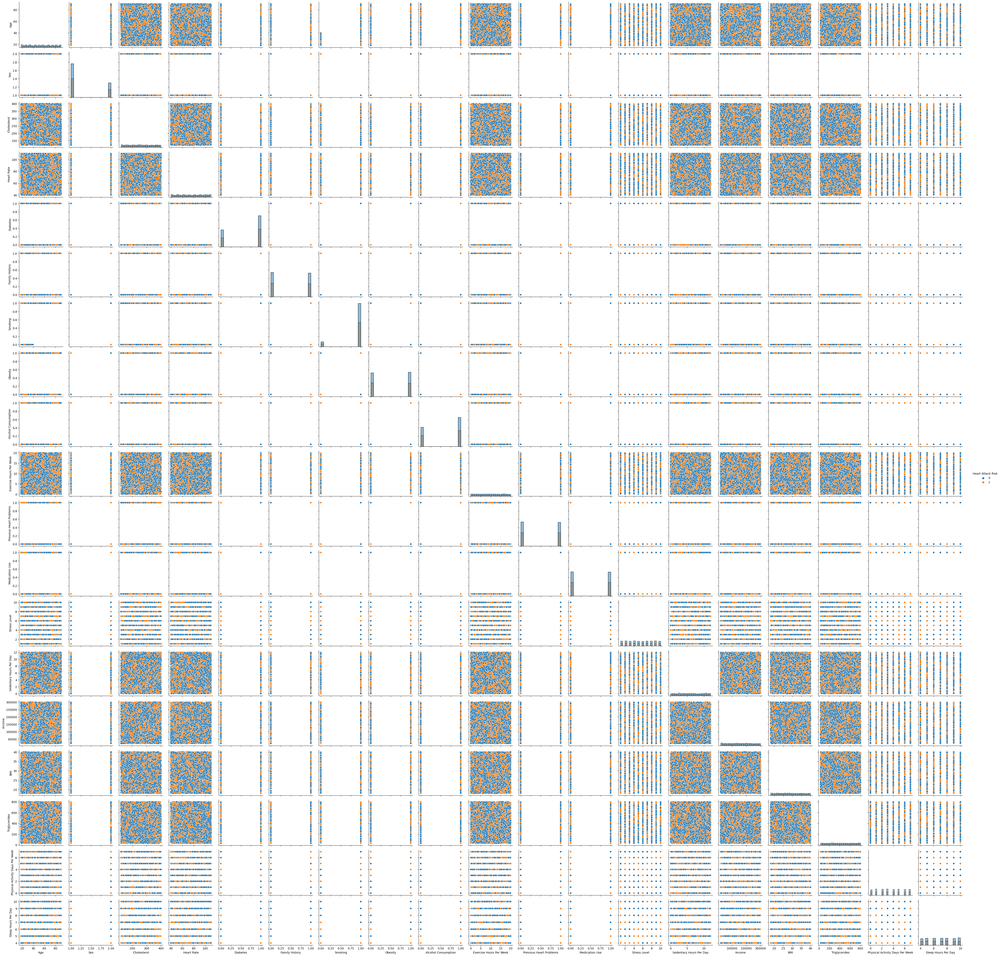

In [171]:
g = sns.PairGrid(df, hue="Heart Attack Risk")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

- The above pair grid shows the graph of all the datas in the data set with Heart attack rate as the hue

In [174]:
fig = px.pie(df, names='Heart Attack Risk', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

- The above pie chart shows the percentage count of people having Heart attack problems.
- 64.2% of the people in the survey of people have no risk of Heart attack.
- 35.8% of the people in the survey have risk of Heart attack.

## Analysis from the above graphs and plots (Conclusion):

***Interpreting the above graph we can conclude the following things :***
- As there is a high corelation between heart attack rate to cholestrol, Diabetes and exercise hours per week, Heart attack rate is in high chance of fluctuating in the change of the factors.
- The Heart attack rate may depend on the country factor too and the reason being the cholesterol factor affecting the heart attack risk rate.
- People in USA are more prone to Heart attack risk in the future too as suggested by the above analysis.
- Peple with Higher sleep hours with less exercise hours per week have higher rate of heart attack from the analysis.
- The people with lower exercise hours of 0-5 are seen having higher cholesterol and people with higher cholesterol have higher chance of heart attack.
